In [1]:
import json

In [2]:
metadata_file = 'metadata.json'

with open(metadata_file, 'r') as file:
    metadata = json.load(file)

# show first 10 entries
for i, entry in enumerate(metadata):
    if i >= 10:
        break
    print(f"Entry {i + 1}:")
    for key, value in entry.items():
        print(f"  {key}: {value}")
    print()  # Print a newline for better readability

Entry 1:
  diagnosis: Prostate adenocarcinoma.
  conclusion: Acinar adenocarcinoma of the prostate gland, Gleason score 4+5=9, Grade Group 5, with foci of extraprostatic, lymphovascular and perineural invasion.
  diff_diagnostic: 
  grossing: Urogenital system: Prostate, biopsy. Marking: 1-12. Biopsies in the form of tissue columns: Number of biopsies: 12. Biopsy length (mm): 20. Biopsy diameter (mm): 1. Comment: right lobe. Urogenital system: Prostate, biopsy. Marking: 13-24. Biopsies in the form of tissue columns: Number of biopsies: 12. Biopsy length (mm): 20. Biopsy diameter (mm): 1. Comment: left lobe.
  micro_protocol: Urogenital system: Prostate. Biopsy type: core needle biopsy of the prostate. Procedure: transrectal biopsy (TRUS biopsy). Material marking: each specimen in a separate container with indication of localization. Microscopic description: Specimen number: 1. Pathomorphological changes: carcinoma. Type of carcinoma: acinar adenocarcinoma. Gleason score: 4+5=9. Percent

In [3]:
for i, entry in enumerate(metadata):
    if "seborr" in entry.get("diagnosis", "").lower():
        print(f"Entry {i + 1} contains 'Seborrhoeic keratosis':")
        for key, value in entry.items():
            print(f"  {key}: {value}")
        print()

Entry 21321 contains 'Seborrhoeic keratosis':
  age: 36.0
  gender: m
  icd10: 
  specialization: 
  case_mapping: histai/HISTAI-skin-b2/case_00224
  diagnosis: Seborrheic keratosis.
  conclusion: Seborrheic keratosis of the abdominal skin, mixed (papillomatous and keratotic) histological variant, removed with clear margins.
  diff_diagnostic: 
  grossing: 
  micro_protocol: Skin lesion with papillomatous proliferation of basaloid cells, marked hyperkeratosis, and horn cysts within the epithelium. Melanin pigment deposition is present in the basal layer of the epidermis. A thin strip of underlying tissue is seen, with no elements of the lesion along the resection line.
  additional_info: 

Entry 21345 contains 'Seborrhoeic keratosis':
  age: 67.0
  gender: m
  icd10: D23
  specialization: 
  case_mapping: histai/HISTAI-skin-b2/case_15905
  diagnosis: Seborrheic keratosis.
  conclusion: Seborrheic keratosis of the skin.
  diff_diagnostic: 
  grossing: 
  micro_protocol: 
  additional_in

In [4]:
# filter all with specialization "Skin" or "skin"
skin_entries = [entry for entry in metadata if entry.get('specialization', '').lower() == 'skin']

def first_10(entries):
    return entries[:10]

def print_entries(entries):
    for i, entry in enumerate(entries):
        print(f"Entry {i + 1}:")
        for key, value in entry.items():
            print(f"  {key}: {value}")
        print()  # Print a newline for better readability
# show first 10 skin entries
print_entries(first_10(skin_entries))

Entry 1:
  age: 70
  gender: m
  icd10: C43, C44, D22
  specialization: Skin
  case_mapping: histai/HISTAI-skin-b2/case_20483
  diagnosis: Skin neoplasm.
  conclusion: 1 - Borderline dysplastic melanocytic nevus of the left shoulder skin with low-grade melanocyte dysplasia and evidence of trauma. Resection margin clear of nevus structures. 2 - Basal cell carcinoma of the skin of the back. Resection margin clear of tumor growth. 3 - Superficial spreading melanoma of the lumbar skin with a maximum thickness of 0.3 mm, without skin ulceration and without involvement of the resection margins. At least pT1a. 4 - Superficial spreading melanoma of the right shoulder skin with a maximum thickness of 0.8 mm, without skin ulceration and without involvement of the resection margins. At least pT1a. Comment: In the material marked as #3 and #4 (superficial spreading melanomas), dermal clusters of cells suspicious for atypical melanocytes are present. To clarify the nature of these cells and to accu

In [5]:
# split dataset by occurence of IHC in conclusion or microprotocol
ihc_entries = [entry for entry in skin_entries if 'IHC' in entry.get('conclusion', '') or 'IHC' in entry.get('microprotocol', '')]
non_ihc_entries = [entry for entry in skin_entries if entry not in ihc_entries]

# show first 10 IHC skin entries
print("First 10 IHC skin entries:")
print_entries(first_10(ihc_entries))

# show first 10 non-IHC skin entries
print("First 10 non-IHC skin entries:")
print_entries(first_10(non_ihc_entries))

First 10 IHC skin entries:
Entry 1:
  age: 76
  gender: f
  icd10: C43.7
  specialization: Skin
  case_mapping: histai/HISTAI-skin-b2/case_04631
  diagnosis: Melanoma of the skin of the right lower extremity.
  conclusion: Superficial spreading melanoma of the thigh, pT4b. Removed within clear margins. PD-L1 expression results (clone 28-8): PD-L1 expression &lt; 1%. PD-L1 expression results (clone 22C3): MEL Score 2: &gt;/=1&lt;10%, TPS 2%, CPS = 1. Membranous PD-L1 expression (SP142) in tumor and tumor-infiltrating inflammatory cells is absent. Currently, there are no guidelines for interpreting IHC results with the PD-L1(SP142) clone in skin melanomas. Membranous PD-L1 expression (SP263) is detected in 2-5% of tumor cells. Membranous PD-L1 expression (SP263) is detected in 20% of tumor-infiltrating inflammatory cells. Currently, there are no guidelines for interpreting IHC results with the PD-L1(SP263) clone in skin melanomas.
  diff_diagnostic: 
  grossing: Skin: Skin flap. Marking:

In [6]:
from ollama import chat
from ollama import ChatResponse

response: ChatResponse = chat(model='deepseek-r1:7b', messages=[
  {
    'role': 'user',
    'content': 'Why is the sky blue?',
  },
])
print(response['message']['content'])
# or access fields directly from the response object
print(response.message.content)

<think>

</think>

The sky appears blue because of a phenomenon called Rayleigh scattering. When sunlight reaches Earth's atmosphere, it interacts with the gases and small particles in the air. Sunlight is made up of different colors, each traveling at slightly different speeds. Blue light scatters in all directions throughout the atmosphere, making it appear evenly spread out in all parts of the sky. This scattered light is what we see as blue.

On the other hand, red light has longer wavelengths and doesn't scatter as much, so it can be seen more clearly during sunrise and sunset when the Sun is near the horizon. That's why sunsets often look red or orange!
<think>

</think>

The sky appears blue because of a phenomenon called Rayleigh scattering. When sunlight reaches Earth's atmosphere, it interacts with the gases and small particles in the air. Sunlight is made up of different colors, each traveling at slightly different speeds. Blue light scatters in all directions throughout the

In [ ]:
# use ollama deepseek-r1:7b model to double-check if the non ihc entries are indeed non-ihc

# convice a system prompt to use the deepseek-r1:7b model
system_prompt = {
    'role': 'system',
    'content': 'You are a medical expert specializing in dermatopathology. Your task is to determine if the provided entries are related to IHC (Immunohistochemistry) or not. Focus only on H&E stainings and avoid any IHC-related content. Keep your responses concise and to the point, and start with "Yes" or "No".',
}
for id, entry in enumerate(non_ihc_entries):
    response: ChatResponse = chat(model='deepseek-r1:7b', messages=[
        {
            'role': 'system',
            'content': system_prompt['content'],
        },
        {
            'role': 'user',
            'content': f"Is this entry about IHC or contain further staining or antibody procedures? It should only be based on H&E stainings: {entry}",
        },
    ])
    print(f"Entry: {id}, IHC Check: {response['message']['content']}")
    # or access fields directly from the response object
    print(f"Entry: {id}, IHC Check: {response.message.content}")

Entry: 0, IHC Check: <think>
Alright, so I need to determine if this entry is related to IHC or contains further staining or antibody procedures. The user specifically mentioned focusing only on H&E stainings and avoiding any IHC content.

Looking at the entry provided, it's a detailed histopathological report of several skin lesions. The main findings include diagnoses like skin neoplasm, basal cell carcinoma, and melanoma with specific depths (pT1a). The section that catches my attention is where they mention using immunohistochemical testing with specific antibodies: HMB45, Ki-67, and p16.

Wait a minute, the user said to focus only on H&E stainings. I know that H&E is a standard routine histological staining used for general tissue sections, but here the report mentions additional IHC procedures beyond just H&E. So even though H&E is part of the examination, the entry goes further into using specific antibodies for more detailed analysis.

The question is whether this entry include

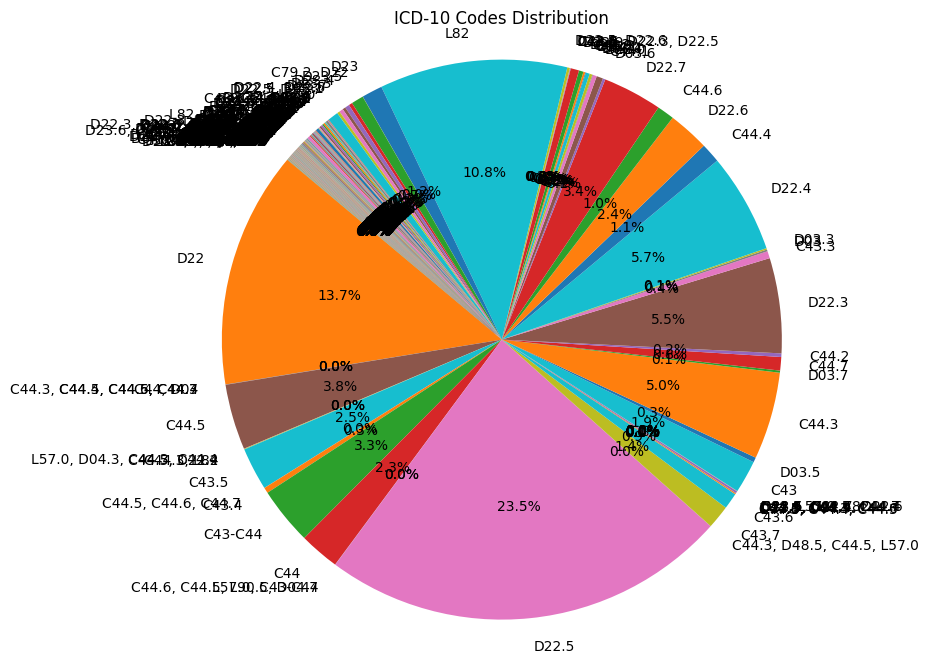

In [6]:
from collections import Counter

c = Counter([entry.get("icd10", "Unknown") for entry in non_ihc_entries if entry.get("icd10")])

# make pie chart of all icd10 codes with their percentage
import matplotlib.pyplot as plt

def plot_icd10_pie(icd10_counts):
    labels = icd10_counts.keys()
    sizes = icd10_counts.values()

    plt.figure(figsize=(10, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')  # Equal aspect ratio ensures that pie chart is a circle.
    plt.title('ICD-10 Codes Distribution')
    plt.show()

plot_icd10_pie(c)

In [7]:
# get total number of icd10 codes from c
total_icd10_codes = len(c)
print(f"Total number of WSI: {len(non_ihc_entries)}")
print(f"Total number of ICD-10 codes: {total_icd10_codes}")

# split the keys by their ","
seperate_icd10_codes = []
for key in c.keys():
    codes = key.split(',')
    for code in codes:
        seperate_icd10_codes.extend([code.strip() for code in codes if code.strip()])  # Strip whitespace and filter out empty strings

print(f"Total number of unique ICD-10 codes: {len(set(seperate_icd10_codes))}")

# get average number of entries per icd10 code + std
import numpy as np

icd10_values = list(c.values())
average_entries = np.mean(icd10_values)
std_entries = np.std(icd10_values)
print(f"Average number of entries per ICD-10 code: {average_entries:.2f}")
print(f"Standard deviation of entries per ICD-10 code: {std_entries:.2f}")


Total number of WSI: 14592
Total number of ICD-10 codes: 293
Total number of unique ICD-10 codes: 137
Average number of entries per ICD-10 code: 49.72
Standard deviation of entries per ICD-10 code: 266.34


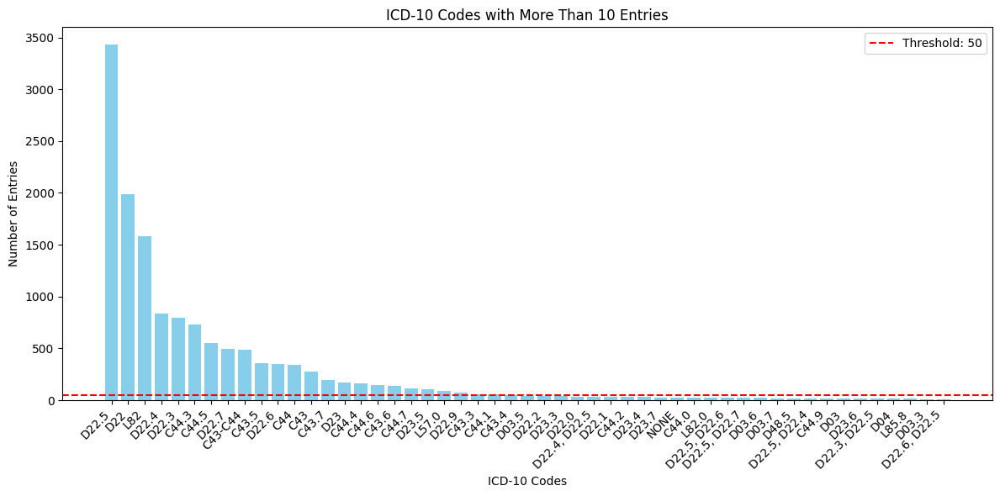

In [8]:
# sort c by values in descending order
# print bar chart with counts
# threshold of 10
sorted_icd10 = dict(sorted(c.items(), key=lambda item: item[1], reverse=True))
filtered_icd10 = {k: v for k, v in sorted_icd10.items() if v >= 10}

def plot_icd10_bar(icd10_counts, t_line: int = 50):
    labels = list(icd10_counts.keys())
    sizes = list(icd10_counts.values())

    plt.figure(figsize=(12, 6))
    plt.bar(labels, sizes, color='skyblue')
    plt.axhline(y=t_line, color='r', linestyle='--', label=f'Threshold: {t_line}')
    plt.xlabel('ICD-10 Codes')
    plt.ylabel('Number of Entries')
    plt.title('ICD-10 Codes with More Than 10 Entries')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.legend()
    plt.show()

plot_icd10_bar(filtered_icd10)

In [9]:
len(skin_entries), len(ihc_entries), len(non_ihc_entries), len(non_ihc_entries) / len(skin_entries) * 100

(14649, 57, 14592, 99.61089494163424)

In [10]:
# get all unique values of the "specialization" field
unique_specializations = set(entry.get('specialization', '').lower() for entry in metadata if entry.get('specialization'))
print(f"Unique specializations: {unique_specializations}")

c_specialization = Counter([entry.get("specialization", "Unknown").lower() for entry in metadata if entry.get("specialization")])
c_specialization = dict(sorted(c_specialization.items(), key=lambda item: item[1], reverse=True))
c_specialization

Unique specializations: {'central nervous system', 'unknown', 'hematologic', 'gynecologic', 'soft tissue', 'head and neck', 'endocrine', 'breast', 'skin', 'genitourinary', 'cancer of unknown primary origin', 'thorax', 'gastrointestinal'}


{'skin': 14649,
 'breast': 1571,
 'gastrointestinal': 1034,
 'thorax': 592,
 'hematologic': 198,
 'genitourinary': 91,
 'gynecologic': 66,
 'soft tissue': 53,
 'unknown': 12,
 'head and neck': 4,
 'endocrine': 3,
 'cancer of unknown primary origin': 3,
 'central nervous system': 1}

In [11]:
sum(c_specialization.values())

18277

In [12]:
len(metadata)

46128

In [13]:
skin_cases = [entry for entry in metadata if "skin" in entry.get("case_mapping", "").lower()]
len(skin_cases)

21677

In [14]:
for i, entry in enumerate(skin_cases):
    if entry.get('specialization', '').lower() != 'skin':
        print(f"Entry {i + 1}:")
        for key, value in entry.items():
            print(f"  {key}: {value}")
        print()

Entry 2:
  age: 0
  gender: f
  icd10: C44.9
  specialization: Unknown
  case_mapping: histai/HISTAI-skin-b1/case_0927
  diagnosis: Melanoma.
  conclusion: Fragment of skin with growth of pigmented melanoma into the dermis. The morphological picture may correspond to an intradermal metastasis of melanoma or primary pigmented melanoma of the skin. Tumor cellularity assessment (see protocol).
  diff_diagnostic: 
  grossing: 
  micro_protocol: Skin: Microdescription; Description of preparations: Marking: Block 4538648-03 770130213401 / 268851-1B. Slide 268851-1B-1, 268851-1B-12; In the prepared histological sections from block 4538648-03 770130213401 / 268851-1B, a fragment of skin with a nodule of tumor growth into the dermis is visualized, represented by solid and large, confluent nest-like structures composed predominantly of spindle-shaped and epithelioid cells with moderate eosinophilic cytoplasm and elongated, rounded, moderately pleomorphic nuclei of medium to large size, with 1-2 

In [15]:
skin_non_ihc = [case for case in skin_cases if "ihc" not in case.get("micro_protocol", "").lower() and "ihc" not in case.get("conclusion", "").lower()]
print(f"Total number of skin cases: {len(skin_cases)}")
print(f"Total number of skin cases without IHC: {len(skin_non_ihc)}")
print(f"Percentage of skin cases without IHC: {len(skin_non_ihc) / len(skin_cases) * 100:.2f}%")

Total number of skin cases: 21677
Total number of skin cases without IHC: 21456
Percentage of skin cases without IHC: 98.98%


Total number of ICD-10 codes in skin cases without IHC: 401


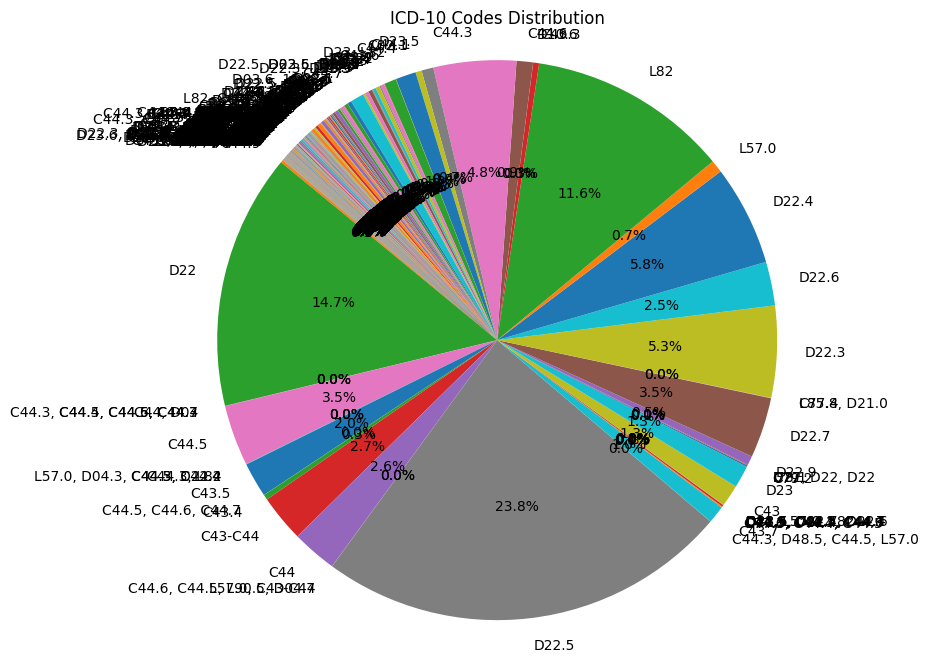

In [16]:
icd10_counts = Counter([case.get("icd10", "Unknown") for case in skin_non_ihc if case.get("icd10")])
print(f"Total number of ICD-10 codes in skin cases without IHC: {len(icd10_counts)}")

plot_icd10_pie(icd10_counts)

In [17]:
# split the keys by their ","
seperate_icd10_codes = []
for key in icd10_counts.keys():
    codes = key.split(',')
    for code in codes:
        seperate_icd10_codes.extend([code.strip() for code in codes if code.strip()])  # Strip whitespace and filter out empty strings

print(f"Total number of unique ICD-10 codes: {len(set(seperate_icd10_codes))}")

# get average number of entries per icd10 code + std
import numpy as np

icd10_values = list(c.values())
average_entries = np.mean(icd10_values)
std_entries = np.std(icd10_values)
print(f"Average number of entries per ICD-10 code: {average_entries:.2f}")
print(f"Standard deviation of entries per ICD-10 code: {std_entries:.2f}")

Total number of unique ICD-10 codes: 174
Average number of entries per ICD-10 code: 49.72
Standard deviation of entries per ICD-10 code: 266.34


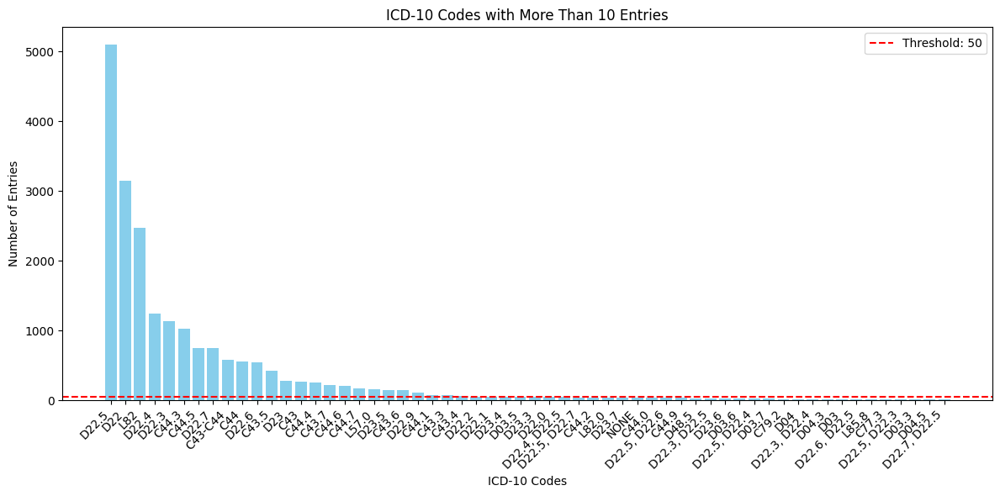

In [18]:
sorted_icd10 = dict(sorted(icd10_counts.items(), key=lambda item: item[1], reverse=True))
filtered_icd10 = {k: v for k, v in sorted_icd10.items() if v >= 10}

plot_icd10_bar(filtered_icd10)

In [19]:
# create function to create a table with number of different icd10 codes based on threshold
# threshhold is increasing in 10s
def create_icd10_table(icd10_counts, threshold=10):
    thresholds = list(range(threshold, max(icd10_counts.values()) + threshold, threshold))
    table = {t: 0 for t in thresholds}

    for count in icd10_counts.values():
        for t in thresholds:
            if count >= t:
                table[t] += 1

    return table

def pprint_table(table):
    print("ICD-10 Code Count Table:")
    print("-" * 30)
    for threshold, count in table.items():
        print(f"Threshold {threshold}: {count} codes")
    print("-" * 30)

code_table = create_icd10_table(icd10_counts, threshold=10)
pprint_table(code_table)

ICD-10 Code Count Table:
------------------------------
Threshold 10: 58 codes
Threshold 20: 46 codes
Threshold 30: 40 codes
Threshold 40: 35 codes
Threshold 50: 27 codes
Threshold 60: 25 codes
Threshold 70: 24 codes
Threshold 80: 22 codes
Threshold 90: 22 codes
Threshold 100: 22 codes
Threshold 110: 22 codes
Threshold 120: 21 codes
Threshold 130: 21 codes
Threshold 140: 21 codes
Threshold 150: 19 codes
Threshold 160: 18 codes
Threshold 170: 17 codes
Threshold 180: 17 codes
Threshold 190: 17 codes
Threshold 200: 17 codes
Threshold 210: 16 codes
Threshold 220: 15 codes
Threshold 230: 15 codes
Threshold 240: 15 codes
Threshold 250: 15 codes
Threshold 260: 14 codes
Threshold 270: 14 codes
Threshold 280: 12 codes
Threshold 290: 12 codes
Threshold 300: 12 codes
Threshold 310: 12 codes
Threshold 320: 12 codes
Threshold 330: 12 codes
Threshold 340: 12 codes
Threshold 350: 12 codes
Threshold 360: 12 codes
Threshold 370: 12 codes
Threshold 380: 12 codes
Threshold 390: 12 codes
Threshold 400: 12

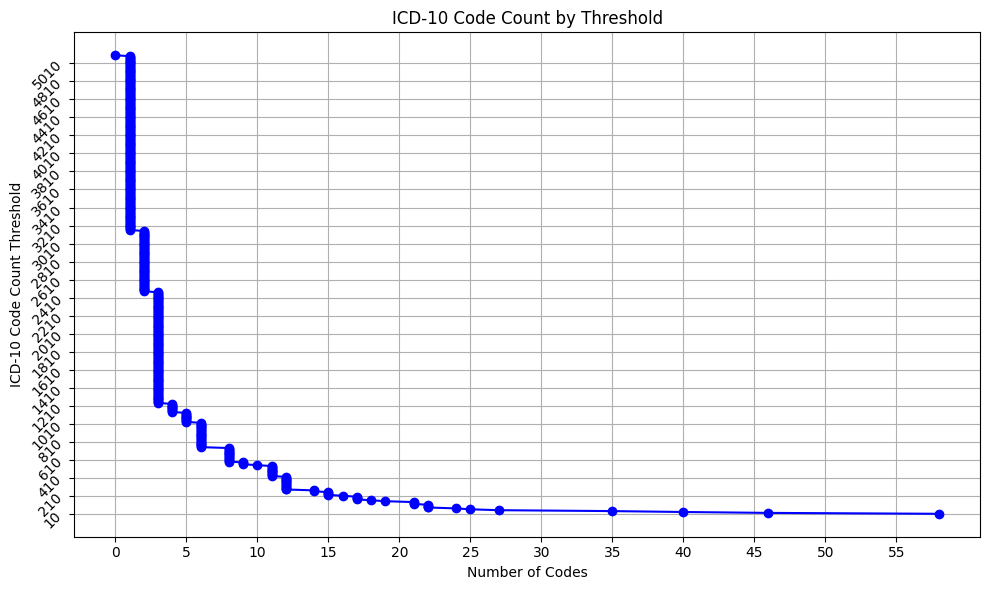

In [20]:
def plot_threshold_count_table_as_line(table):
    thresholds = list(table.keys())
    counts = list(table.values())

    plt.figure(figsize=(10, 6))
    plt.plot(counts, thresholds, marker='o', linestyle='-', color='blue')
    plt.ylabel('ICD-10 Code Count Threshold')
    plt.xlabel('Number of Codes')
    plt.title('ICD-10 Code Count by Threshold')
    plt.yticks(thresholds[::20], rotation=45)
    plt.xticks(range(0, max(counts) + 1, 5))
    plt.tight_layout()
    plt.grid(True)
    plt.show()

plot_threshold_count_table_as_line(code_table)


In [21]:
(43757+7710)/(20621+1778)

2.2977365060940222

In [22]:
seperate_icd10_codes

['C43',
 'C44',
 'D22',
 'C43',
 'C44',
 'D22',
 'C43',
 'C44',
 'D22',
 'C44.9',
 'D22',
 'C44.4',
 'C44.5',
 'C44.3',
 'C44.4',
 'C44.5',
 'C44.3',
 'C44.4',
 'C44.5',
 'C44.3',
 'C44',
 'D04',
 'C44',
 'D04',
 'C44.3',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.3',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.3',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.3',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.5',
 'L57.0',
 'D04.3',
 'C44.3',
 'C44.4',
 'L57.0',
 'D04.3',
 'C44.3',
 'C44.4',
 'L57.0',
 'D04.3',
 'C44.3',
 'C44.4',
 'L57.0',
 'D04.3',
 'C44.3',
 'C44.4',
 'C44.5',
 'D22.4',
 'C44.5',
 'D22.4',
 'C44.3',
 'L82',
 'C44.3',
 'L82',
 'C43.5',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.5',
 'C44.6',
 'C44.7',
 'C44.5',
 'C44.6',
 'C44.7',
 'C43.4',
 'C43-C44',
 'C44',
 'C44.6',
 'C44.5',
 'L90.5',
 'D04.7',
 'C44.6',
 'C44.5',
 'L90.5',
 'D04.7',
 'C44.6',
 'C44.5',
 'L90.5',
 'D04.7',
 'C44.6',
 'C44.5',
 'L90.5',
 'D04.7',
 'L57.0',
 'C43-C44',
 'L57.0',
 'C43-C44',
 'D22.5',
 'C44.3',
 'D48.5',
 'C44.5',
 'L57.0'

In [23]:
# now lets get a 3d of the granularity of the icd10 codes
# steps are first chapter (so c43 same as c44 but not as d22)
# then second chapter (c43.0 same as c43.1 but not as c44.2)
from collections import defaultdict
map_granularity = defaultdict(
    lambda: {
        'count': 0,
        'subchapters': defaultdict(
            lambda: {'count': 0, 'subchapters': defaultdict(lambda: {'count': 0})}
        )
    }
)


for icd10_code in seperate_icd10_codes:
    alpha_numeric = icd10_code[0].isalpha() and icd10_code[1:].replace('.', '').isdigit()
    if not alpha_numeric:
        continue
    icd10_code = icd10_code.strip()  # Remove any leading/trailing
    if not icd10_code:
        continue
    chapter_1 = icd10_code[0]  # First character is the chapter
    map_granularity[chapter_1]['count'] += 1
    parts = icd10_code[1:].split('.')
    if len(parts) == 1:
        # First chapter
        chapter = parts[0]
        map_granularity[chapter_1]['subchapters'][chapter]["count"] += 1
    elif len(parts) == 2:
        # Second chapter
        chapter, subchapter = parts
        map_granularity[chapter_1]['subchapters'][chapter]["count"] += 1
        map_granularity[chapter_1]['subchapters'][chapter]['subchapters'][subchapter]["count"] += 1


# Print the map_granularity
def print_granularity_map(granularity_map, level=0):
    indent = '  ' * level
    for key, value in granularity_map.items():
        print(f"{indent}{key}: {value['count']}")
        if value.get('subchapters', None):
            print_granularity_map(value['subchapters'], level + 1)
print_granularity_map(map_granularity)

C: 556
  43: 66
    5: 28
    4: 1
    7: 9
    3: 7
    6: 7
    9: 1
    0: 1
    1: 1
    2: 3
  44: 437
    9: 1
    4: 47
    5: 109
    3: 111
    6: 57
    7: 35
    1: 13
    2: 17
    0: 10
    8: 1
  77: 13
    3: 5
    4: 3
    0: 1
    9: 1
  79: 13
    2: 5
    8: 5
  02: 2
    1: 1
    9: 1
  04: 1
  52: 1
  76: 2
    1: 1
  05: 1
    1: 1
  78: 3
    7: 2
  61: 2
  80: 1
  49: 2
    4: 1
    6: 1
  60: 3
    0: 1
    8: 1
  06: 1
    0: 1
  34: 1
    2: 1
  00: 2
    4: 1
    0: 1
  51: 2
    0: 1
    9: 1
  22: 2
    6: 2
  21: 1
    1: 1
D: 604
  22: 360
    4: 52
    5: 97
    7: 41
    6: 54
    9: 3
    3: 51
    2: 7
    1: 5
    0: 3
    8: 1
  04: 72
    3: 20
    7: 5
    0: 3
    5: 10
    6: 9
    4: 5
    1: 2
    2: 2
  48: 14
    5: 11
    1: 1
    9: 1
  23: 89
    6: 10
    5: 22
    4: 7
    7: 11
    2: 3
    3: 17
    1: 1
    9: 1
    0: 1
  21: 6
    0: 2
    3: 2
    2: 1
    9: 1
  10: 6
    6: 1
    3: 1
    4: 1
    5: 1
    0: 1
  28: 9
    7: 1

In [24]:
map_granularity["C"]

{'count': 556,
 'subchapters': defaultdict(<function __main__.<lambda>.<locals>.<lambda>()>,
             {'43': {'count': 66,
               'subchapters': defaultdict(<function __main__.<lambda>.<locals>.<lambda>.<locals>.<lambda>()>,
                           {'5': {'count': 28},
                            '4': {'count': 1},
                            '7': {'count': 9},
                            '3': {'count': 7},
                            '6': {'count': 7},
                            '9': {'count': 1},
                            '0': {'count': 1},
                            '1': {'count': 1},
                            '2': {'count': 3}})},
              '44': {'count': 437,
               'subchapters': defaultdict(<function __main__.<lambda>.<locals>.<lambda>.<locals>.<lambda>()>,
                           {'9': {'count': 1},
                            '4': {'count': 47},
                            '5': {'count': 109},
                            '3': {'count': 111}

In [25]:
"C44.9".strip()

'C44.9'

1
2.5
2.5
3.375


/home/tobechanged/miniconda3/envs/go_bio/lib/python3.12/site-packages/radialtree.py:441: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


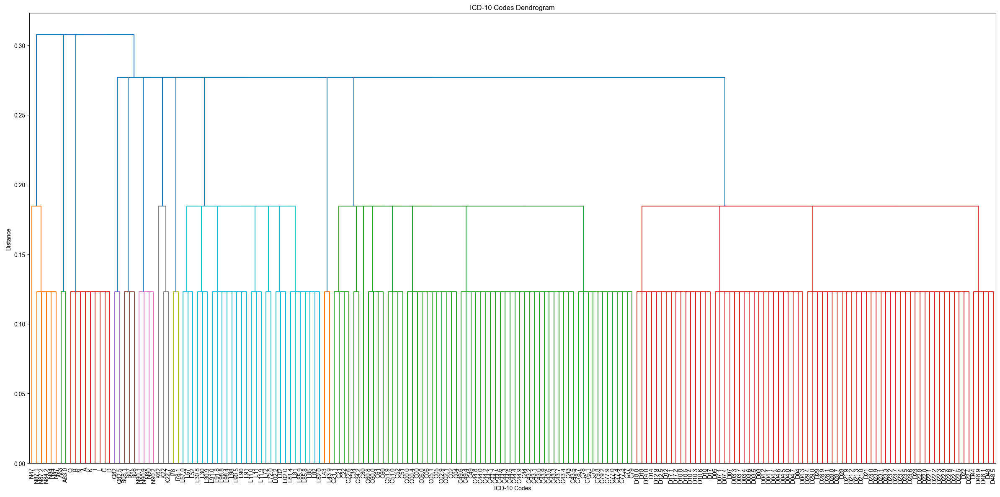

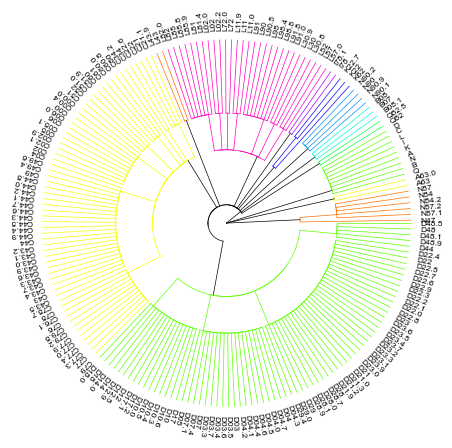

In [26]:
# convert the map_granularity to a scipy clustering dendrogram
# the tree branches should be the chapters, subchapters, and codes
# the linkage should be based on the count of the codes
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
import radialtree


def distance_between_nodes(node1: str, node2: str) -> int:
    node1 = node1.replace('.', '')
    node2 = node2.replace('.', '')
    min_multiplier = 1
    pos_= 0
    dist = 0
    longer, shorter = (node1[::-1], node2[::-1]) if len(node1) > len(node2) else (node2[::-1], node1[::-1])

    while pos_ < len(longer) - len(shorter):
        dist += min_multiplier
        min_multiplier *= 1.5
        pos_ += 1

    for i in range(len(shorter)):
        if longer[i + pos_] != shorter[i]:
            dist = dist + min_multiplier
        min_multiplier *= 1.5
    return dist

print(distance_between_nodes("C44.9", "C44.2"))
print(distance_between_nodes("C44.9", "C43"))
print(distance_between_nodes("C449", "C43"))
print(distance_between_nodes("D44.9", "C44.9"))



def create_dendrogram(granularity_map):
    # create linkage data
    linkage_data = []
    all_nodes = []
    sizes = []
    for chapter, chapter_data in granularity_map.items():
        all_nodes.append(chapter)
        sizes.append(chapter_data['count'])
        for subchapter, subchapter_data in chapter_data['subchapters'].items():
            all_nodes.append(f"{chapter}{subchapter}")
            sizes.append(subchapter_data['count'])
            if 'subchapters' in subchapter_data:
                for code, code_data in subchapter_data['subchapters'].items():
                    all_nodes.append(f"{chapter}{subchapter}.{code}")
                    sizes.append(code_data['count'])

    # build the distance matrix
    num_nodes = len(all_nodes)
    distance_matrix = np.zeros((num_nodes, num_nodes))
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            dist = distance_between_nodes(all_nodes[i], all_nodes[j])
            distance_matrix[i][j] = dist
            distance_matrix[j][i] = dist

    # normalize the distance matrix
    max_distance = np.max(distance_matrix)
    if max_distance > 0:
        distance_matrix /= max_distance
    else:
        print("Warning: Maximum distance is zero, normalization skipped.")

    # Create the linkage matrix
    """
    yndarray

        A condensed distance matrix. A condensed distance matrix is a flat array containing the upper triangular of the distance matrix. This is the form that pdist returns. Alternatively, a collection of

    observation vectors in dimensions may be passed as an by array. All elements of the condensed distance matrix must be finite, i.e., no NaNs or infs.
    """
    upper_triangular_indices = np.triu_indices(num_nodes, k=1)
    condensed_distance_matrix = distance_matrix[upper_triangular_indices]
    Z = linkage(condensed_distance_matrix, method='single')

    #print("Linkage matrix:")
    #print(Z)

    # Create the dendrogram
    plt.figure(figsize=(24, 12))
    Z2 = dendrogram(Z, labels=all_nodes, leaf_rotation=90, leaf_font_size=10)
    plt.title('ICD-10 Codes Dendrogram')
    plt.xlabel('ICD-10 Codes')
    plt.ylabel('Distance')
    plt.tight_layout()
    #plt.show()

    radialtree.plot(Z2, fontsize=6)


create_dendrogram(map_granularity)

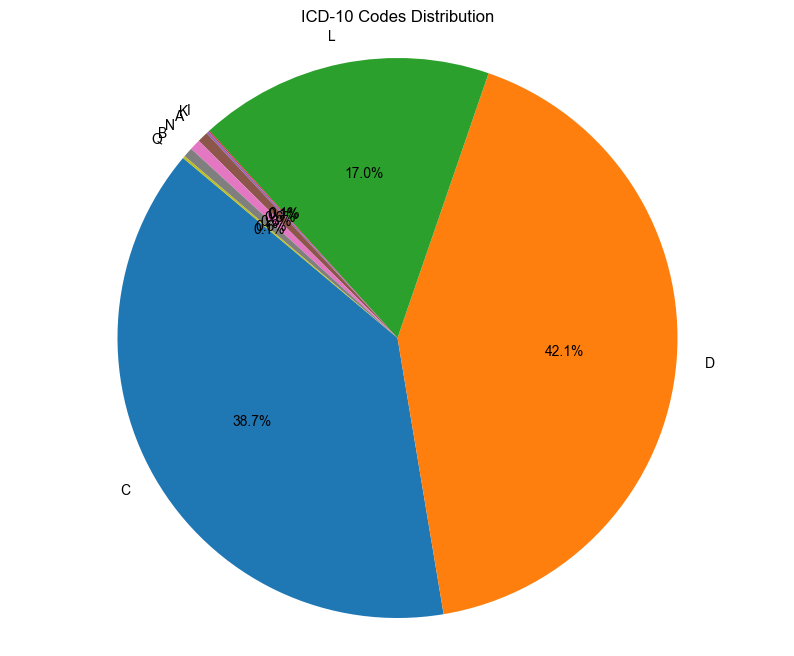

In [27]:
# create pie chart with counts of each level
# level0
counts = [chapter_data['count'] for chapter_data in map_granularity.values()]

plot_icd10_pie(dict(zip(map_granularity.keys(), counts)))



['C43', 'C44', 'C77', 'C79', 'C02', 'C04', 'C52', 'C76', 'C05', 'C78', 'C61', 'C80', 'C49', 'C60', 'C06', 'C34', 'C00', 'C51', 'C22', 'C21', 'D22', 'D04', 'D48', 'D23', 'D21', 'D10', 'D28', 'D03', 'D17', 'D12', 'D29', 'D44', 'D14', 'D18', 'D07', 'D05', 'L57', 'L82', 'L90', 'L85', 'L30', 'L72', 'L43', 'L81', 'L11', 'L98', 'L02', 'L91', 'L52', 'I78', 'K62', 'K22', 'A63', 'N90', 'N47', 'N84', 'N87', 'B07', 'B08', 'Q82']


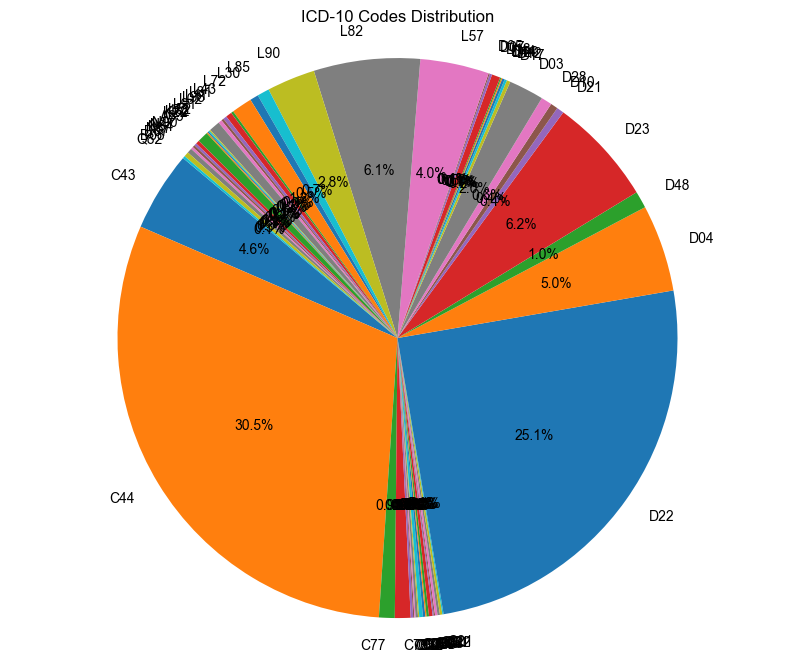

In [28]:
# level1
counts = []
key_list = []
for chapter, chapter_data in map_granularity.items():
    for s_chapter, subchapter_data in chapter_data['subchapters'].items():
        counts.append(subchapter_data['count'])
        key_list.append(f"{chapter}{s_chapter}")

print(key_list)
plot_icd10_pie(dict(zip(key_list, counts)))


['C43.5', 'C43.4', 'C43.7', 'C43.3', 'C43.6', 'C43.9', 'C43.0', 'C43.1', 'C43.2', 'C44.9', 'C44.4', 'C44.5', 'C44.3', 'C44.6', 'C44.7', 'C44.1', 'C44.2', 'C44.0', 'C44.8', 'C77.3', 'C77.4', 'C77.0', 'C77.9', 'C79.2', 'C79.8', 'C02.1', 'C02.9', 'C76.1', 'C05.1', 'C78.7', 'C49.4', 'C49.6', 'C60.0', 'C60.8', 'C06.0', 'C34.2', 'C00.4', 'C00.0', 'C51.0', 'C51.9', 'C22.6', 'C21.1', 'D22.4', 'D22.5', 'D22.7', 'D22.6', 'D22.9', 'D22.3', 'D22.2', 'D22.1', 'D22.0', 'D22.8', 'D04.3', 'D04.7', 'D04.0', 'D04.5', 'D04.6', 'D04.4', 'D04.1', 'D04.2', 'D48.5', 'D48.1', 'D48.9', 'D23.6', 'D23.5', 'D23.4', 'D23.7', 'D23.2', 'D23.3', 'D23.1', 'D23.9', 'D23.0', 'D21.0', 'D21.3', 'D21.2', 'D21.9', 'D10.6', 'D10.3', 'D10.4', 'D10.5', 'D10.0', 'D28.7', 'D28.0', 'D28.1', 'D28.9', 'D03.5', 'D03.6', 'D03.4', 'D03.7', 'D03.3', 'D17.2', 'D17.1', 'D12.5', 'D12.9', 'D29.0', 'D29.4', 'D14.0', 'D18.0', 'D07.4', 'D07.1', 'L57.0', 'L82.0', 'L90.5', 'L85.8', 'L85.9', 'L30.9', 'L30.8', 'L72.0', 'L43.9', 'L81.4', 'L11.9', 

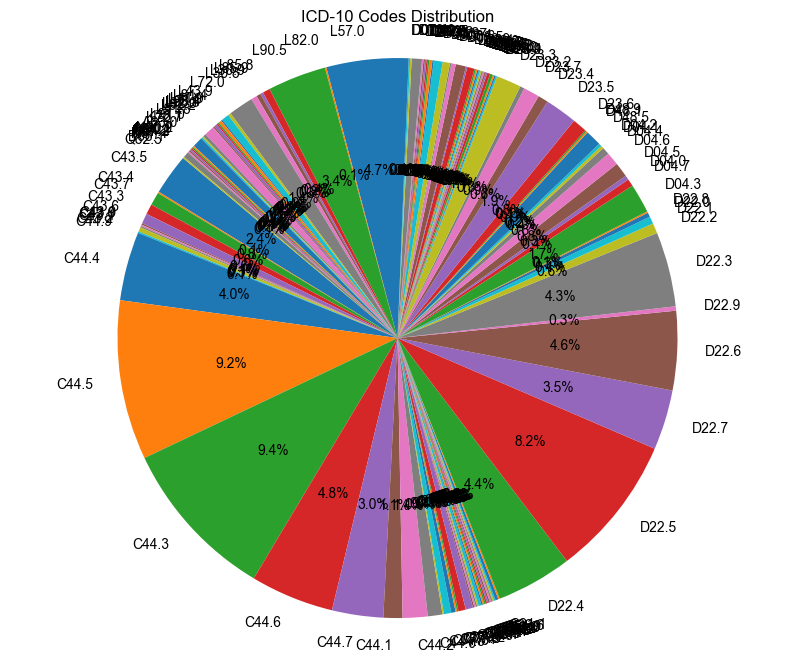

In [29]:
# level3
counts = []
key_list = []
for chapter, chapter_data in map_granularity.items():
    for s_chapter, subchapter_data in chapter_data['subchapters'].items():
        for code, code_data in subchapter_data['subchapters'].items():
            counts.append(code_data['count'])
            key_list.append(f"{chapter}{s_chapter}.{code}")

print(key_list)
plot_icd10_pie(dict(zip(key_list, counts)))

In [30]:
mixed_cases = [entry for entry in metadata if "mixed" in entry.get("case_mapping", "").lower()]
print(f"Total number of mixed cases: {len(mixed_cases)}")
print(mixed_cases[0])

Total number of mixed cases: 21137
{'diagnosis': 'Prostate adenocarcinoma.', 'conclusion': 'Acinar adenocarcinoma of the prostate gland, Gleason score 4+5=9, Grade Group 5, with foci of extraprostatic, lymphovascular and perineural invasion.', 'diff_diagnostic': '', 'grossing': 'Urogenital system: Prostate, biopsy. Marking: 1-12. Biopsies in the form of tissue columns: Number of biopsies: 12. Biopsy length (mm): 20. Biopsy diameter (mm): 1. Comment: right lobe. Urogenital system: Prostate, biopsy. Marking: 13-24. Biopsies in the form of tissue columns: Number of biopsies: 12. Biopsy length (mm): 20. Biopsy diameter (mm): 1. Comment: left lobe.', 'micro_protocol': 'Urogenital system: Prostate. Biopsy type: core needle biopsy of the prostate. Procedure: transrectal biopsy (TRUS biopsy). Material marking: each specimen in a separate container with indication of localization. Microscopic description: Specimen number: 1. Pathomorphological changes: carcinoma. Type of carcinoma: acinar adeno

In [31]:
c_specialization = Counter([entry.get("specialization", "Unknown").lower() for entry in mixed_cases if entry.get("specialization")])
c_specialization = dict(sorted(c_specialization.items(), key=lambda item: item[1], reverse=True))
print(c_specialization)

{'gastrointestinal': 198, 'genitourinary': 90, 'breast': 73, 'gynecologic': 57, 'endocrine': 3, 'unknown': 2}


In [33]:
non_specialization_cases = [entry for entry in mixed_cases if not entry.get("specialization")]
print(f"Total number of mixed cases without specialization: {len(non_specialization_cases)}")
print(non_specialization_cases[0])

Total number of mixed cases without specialization: 20714
{'diagnosis': 'Malignant neoplasm, unspecified.', 'conclusion': 'The immunophenotype and morphological picture of the submitted specimen are consistent with metastases of unspecified breast cancer to soft tissues. Surrogate molecular subtype: Luminal type B, HER2 negative.', 'diff_diagnostic': '', 'grossing': 'Histological specimens and paraffin blocks were provided (see conclusion for labeling). Immunohistochemical stains were performed based on the provided paraffin blocks.', 'micro_protocol': 'Tumors without PWO: Microdescription: Fragments of fibrous-adipose tissue with multiple foci of nests and individual carcinoma cells, cells of medium size, with scant cytoplasm, some cells with signet-ring cell morphology. Immunohistochemical (IHC) study was performed to clarify the histological type of the tumor. Tumor cells express: weak ER (6F11), E-Cadherin (36B5) membranously, Ki67 28%, GATA-3 (L50-823), CK7. Tumor cells do not exp

In [55]:
non_spec_non_ihc = [
    entry
    for entry in non_specialization_cases
    if "ihc" not in entry.get("micro_protocol", "").lower() and
    "ihc" not in entry.get("conclusion", "").lower() and
    "ihc" not in entry.get("grossing", "").lower() and
    "ihc" not in entry.get("diff_diagnostic", "").lower()
]
non_spec_non_ihc = [
    entry
    for entry in non_spec_non_ihc
    if "immunohistochemical" not in entry.get("micro_protocol", "").lower() and
    "immunohistochemical" not in entry.get("conclusion", "").lower() and
    "immunohistochemical" not in entry.get("grossing", "").lower() and
    "immunohistochemical" not in entry.get("diff_diagnostic", "").lower()
]
print(f"Total number of non-specialization cases without IHC: {len(non_spec_non_ihc)}")
print(non_spec_non_ihc[0])

Total number of non-specialization cases without IHC: 14456
{'diagnosis': 'Pancreatic tumor.', 'conclusion': 'Two fragments of adipose tissue with metastases of pancreaticobiliary-type adenocarcinoma.', 'diff_diagnostic': '', 'grossing': 'Soft tissue: Two fragments of adipose tissue measuring 3×4 mm and 9×5 mm.', 'micro_protocol': 'Tumors without prior history: Two fragments of adipose tissue with nodules of tumor composed of epithelioid cells, with clear cytoplasm and atypical nuclei.', 'icd10': '', 'age': '', 'gender': '', 'case_mapping': 'histai/HISTAI-mixed/case_01399', 'additional_info': '', 'specialization': ''}


In [62]:
blacklist_words = ["breast", "rectum", "abdominal", "gynecology", "pharyngeal", "osteo", "pancreatic", "stomach", "gastrointestinal", "intestinal", "ileum", "gastric", "cervical", "lung", "colon", "prostate", "bladder", "kidney", "liver", "pancreas", "ovary", "testis", "thyroid",  "bone",]
non_spec_non_ihc_filtered = [entry for entry in non_spec_non_ihc if not any(word in entry.get("diagnosis", "").lower() for word in blacklist_words)]
non_spec_non_ihc_filtered = [entry for entry in non_spec_non_ihc_filtered if not any(word in entry.get("conclusion", "").lower() for word in blacklist_words)]
non_spec_non_ihc_filtered = [entry for entry in non_spec_non_ihc_filtered if not any(word in entry.get("grossing", "").lower() for word in blacklist_words)]
non_spec_non_ihc_filtered = [entry for entry in non_spec_non_ihc_filtered if not any(word in entry.get("micro_protocol", "").lower() for word in blacklist_words)]
print(f"Total number of non-specialization cases without IHC and filtered: {len(non_spec_non_ihc_filtered)}")
print(non_spec_non_ihc_filtered[0])

Total number of non-specialization cases without IHC and filtered: 925
{'diagnosis': 'Recurrent lipoma of the neck.', 'conclusion': '', 'diff_diagnostic': '', 'grossing': 'Soft tissue: A fragment of yellowish-pink tissue measuring 80×70×40 mm. The cut surface is homogenous.', 'micro_protocol': '', 'icd10': '', 'age': '', 'gender': '', 'case_mapping': 'histai/HISTAI-mixed/case_02321', 'additional_info': '', 'specialization': ''}


In [63]:
with open('mixed_skin.json', 'w') as f:
    json.dump(non_spec_non_ihc_filtered, f, indent=4)
print("Filtered mixed skin cases saved to 'mixed_skin.json'.")


Filtered mixed skin cases saved to 'mixed_skin.json'.
